In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [17]:
import tensorflow as tf
import seaborn as sns
import zipfile
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout

from tensorflow.keras.models import Sequential # Uma rede neural é uma sequência de camadas
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator # O tensorflow já realiza a extração dos pixels.

In [3]:
path = '/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Datasets/fer_images.zip'
zip_object = zipfile.ZipFile(file=path, mode='r')
zip_object.extractall('./')
zip_object.close()

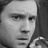

In [4]:
tf.keras.preprocessing.image.load_img('/content/fer2013/train/Angry/0.jpg')

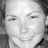

In [5]:
tf.keras.preprocessing.image.load_img('/content/fer2013/train/Happy/1.jpg')

In [31]:
gerador_treinamento = ImageDataGenerator(rescale = 1./255, rotation_range=7, horizontal_flip=True, zoom_range=0.2)

dataset_treinamento = gerador_treinamento.flow_from_directory('/content/fer2013/train',
                                                              target_size=(48,48), # Tamanho das imagens de entrada, a rede foi treinada com estes tamanhos de entrada
                                                              batch_size = 16,
                                                              class_mode='categorical',
                                                              shuffle=True)

Found 28709 images belonging to 7 classes.


In [32]:
dataset_treinamento.classes

array([0, 0, 0, ..., 6, 6, 6], dtype=int32)

In [33]:
np.unique(dataset_treinamento.classes, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6], dtype=int32),
 array([3995,  436, 4097, 7215, 4965, 4830, 3171]))

In [34]:
dataset_treinamento.class_indices

{'Angry': 0,
 'Disgust': 1,
 'Fear': 2,
 'Happy': 3,
 'Neutral': 4,
 'Sad': 5,
 'Surprise': 6}

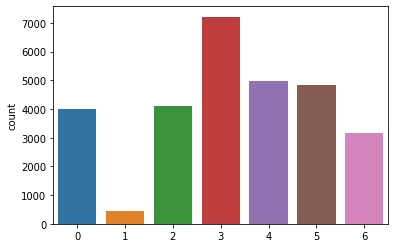

In [35]:
# Visualizando a distribuição de classes
sns.countplot(x = dataset_treinamento.classes)

In [36]:
gerador_teste = ImageDataGenerator(rescale = 1./255)

dataset_teste = gerador_treinamento.flow_from_directory('/content/fer2013/validation',
                                                              target_size=(48,48), # Tamanho das imagens de entrada, a rede foi treinada com estes tamanhos de entrada
                                                              batch_size = 1,
                                                              class_mode='categorical',
                                                              shuffle=False)

Found 3589 images belonging to 7 classes.


In [37]:
numero_detectores = 32 # Número de filtros da classe
numero_classes = 7
largura, altura = 48, 48
epocas = 70

rede = Sequential()

# 1º Bloco
# Camada convolução
rede.add(Conv2D(filters=numero_detectores, kernel_size = (3,3), activation = 'relu', padding = 'same', input_shape = (largura, altura, 3)))
rede.add(BatchNormalization()) # Realiza a normalização dos dados na própria camada
# Camada convolução
rede.add(Conv2D(filters=numero_detectores, kernel_size = (3,3), activation = 'relu', padding = 'same'))
rede.add(BatchNormalization()) 
rede.add(MaxPool2D(pool_size=(2,2))) # Extrai as principais partes da image
rede.add(Dropout(0.2))

# 2º Bloco
rede.add(Conv2D(filters=2*numero_detectores, kernel_size = (3,3), activation = 'relu', padding = 'same'))
rede.add(BatchNormalization()) # Realiza a normalização dos dados na própria camada
# Camada convolução
rede.add(Conv2D(filters=2*numero_detectores, kernel_size = (3,3), activation = 'relu', padding = 'same'))
rede.add(BatchNormalization()) 
rede.add(MaxPool2D(pool_size=(2,2))) # Extrai as principais partes da image
rede.add(Dropout(0.2))

# 3º Bloco
rede.add(Conv2D(filters=2*2*numero_detectores, kernel_size = (3,3), activation = 'relu', padding = 'same'))
rede.add(BatchNormalization()) # Realiza a normalização dos dados na própria camada
# Camada convolução
rede.add(Conv2D(filters=2*2*numero_detectores, kernel_size = (3,3), activation = 'relu', padding = 'same'))
rede.add(BatchNormalization()) 
rede.add(MaxPool2D(pool_size=(2,2))) # Extrai as principais partes da image
rede.add(Dropout(0.2))

# 4º Bloco
rede.add(Conv2D(filters=2*2*2*numero_detectores, kernel_size = (3,3), activation = 'relu', padding = 'same'))
rede.add(BatchNormalization()) # Realiza a normalização dos dados na própria camada
# Camada convolução
rede.add(Conv2D(filters=2*2*2*numero_detectores, kernel_size = (3,3), activation = 'relu', padding = 'same'))
rede.add(BatchNormalization()) 
rede.add(MaxPool2D(pool_size=(2,2))) # Extrai as principais partes da image
rede.add(Dropout(0.2))

rede.add(Flatten())

# 1ª Camada escondida
rede.add(Dense(units = 2*numero_detectores, activation = 'relu'))
rede.add(BatchNormalization())
rede.add(Dropout(0.2))

# 2ª Camada escondida
rede.add(Dense(units = 2*numero_detectores, activation = 'relu'))
rede.add(BatchNormalization())
rede.add(Dropout(0.2))

# Camada de saída
rede.add(Dense(units=numero_classes, activation='softmax'))

print(rede.summary())

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 48, 48, 32)        896       
                                                                 
 batch_normalization_19 (Bat  (None, 48, 48, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_19 (Conv2D)          (None, 48, 48, 32)        9248      
                                                                 
 batch_normalization_20 (Bat  (None, 48, 48, 32)       128       
 chNormalization)                                                
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 24, 24, 32)       0         
 2D)                                                             
                                                      

In [38]:
rede.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [22]:
rede.fit(dataset_treinamento, epochs=epocas)

Epoch 1/70
3589/3589 [==============================] - 62s 14ms/step - loss: 1.8254 - accuracy: 0.2407
Epoch 2/70
1816/3589 [==============>...............] - ETA: 24s - loss: 1.8252 - accuracy: 0.2478

KeyboardInterrupt: ignored

In [39]:
from keras.models import save_model, model_from_json
with open('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Weights/network_emotions.json', 'r') as json_file:
  json_saved_model = json_file.read()

In [40]:
rede_salva = tf.keras.models.model_from_json(json_saved_model)
rede_salva.load_weights('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Weights/weights_emotions.hdf5')
rede_salva.compile(loss='categorical_crossentropy', optimizer='Adam',metrics=['accuracy'])

In [41]:
print(rede.summary())

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 48, 48, 32)        896       
                                                                 
 batch_normalization_19 (Bat  (None, 48, 48, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_19 (Conv2D)          (None, 48, 48, 32)        9248      
                                                                 
 batch_normalization_20 (Bat  (None, 48, 48, 32)       128       
 chNormalization)                                                
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 24, 24, 32)       0         
 2D)                                                             
                                                      

In [42]:
rede_salva.evaluate(dataset_teste)

3589/3589 [==============================] - 30s 8ms/step - loss: 1.4835 - accuracy: 0.5762


[1.4834568500518799, 0.5762050747871399]

In [43]:
previsoes = rede_salva.predict(dataset_teste)

In [47]:
from sklearn.metrics import classification_report
print(classification_report(dataset_teste.classes, np.argmax(previsoes, axis = 1)))

              precision    recall  f1-score   support

           0       0.58      0.53      0.55       491
           1       0.53      0.65      0.59        55
           2       0.48      0.44      0.46       528
           3       0.74      0.88      0.81       879
           4       0.25      0.18      0.21       626
           5       0.49      0.53      0.51       594
           6       0.69      0.74      0.72       416

    accuracy                           0.57      3589
   macro avg       0.54      0.56      0.55      3589
weighted avg       0.54      0.57      0.55      3589



Para detectar as emoções em outras imagens, utilizar apenas as faces

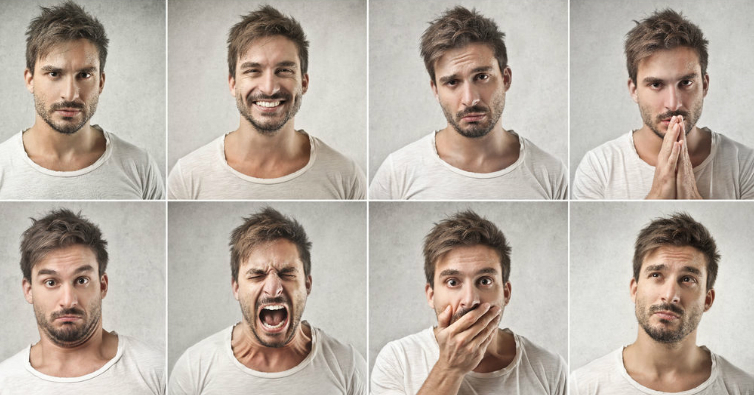

In [48]:
imagem = cv2.imread('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/faces_emotions.png')
cv2_imshow(imagem)

In [50]:
# Detecção das faces
detector_faces = cv2.CascadeClassifier('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Cascades/haarcascade_frontalface_default.xml')

In [51]:
deteccoes = detector_faces.detectMultiScale(imagem)
deteccoes

array([[224,  35,  90,  90],
       [ 23,  41,  92,  92],
       [625,  49,  91,  91],
       [420,  43,  97,  97],
       [420, 242,  97,  97],
       [ 18, 243,  98,  98],
       [229, 242,  85,  85],
       [627, 241,  91,  91]], dtype=int32)

In [52]:
dataset_teste.class_indices.keys()

dict_keys(['Angry', 'Disgust', 'Fear', 'Happy', 'Neutral', 'Sad', 'Surprise'])

In [60]:
emocoes = ['Angry', 'Disgust', 'Fear', 'Happy', 'Neutral', 'Sad', 'Surprise']

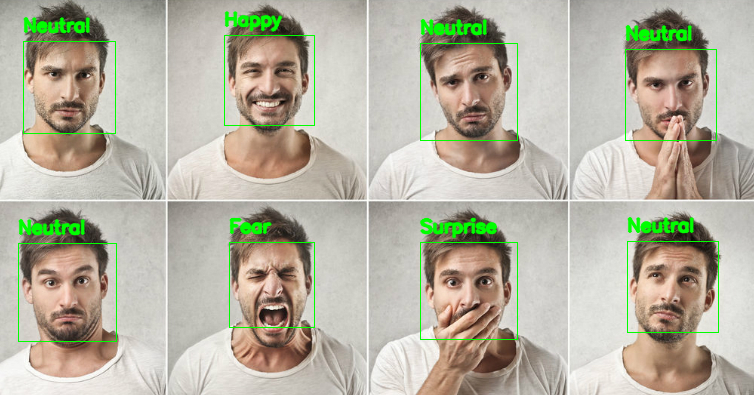

In [61]:
for (x, y, w, h) in deteccoes:
  cv2.rectangle(imagem, (x,y), (x+w,y+h), (0,255,0), 1)

  # Extração e processamento da ROI
  roi = imagem[y:y+h, x:x+w]
  roi = cv2.resize(roi, (48,48))
  roi = roi / 255
  roi = np.expand_dims(roi, axis=0)

  previsao = rede_salva.predict(roi)

  cv2.putText(imagem, emocoes[np.argmax(previsao)], (x, y -10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0),2,cv2.LINE_AA)

cv2_imshow(imagem)

**Detecção de emoções em vídeo**

In [62]:
cap = cv2.VideoCapture('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Videos/emotion_test01.mp4')

conectado, video = cap.read()

In [63]:
save_path = '/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Videos/emotion_test01_result.avi'

fourcc = cv2.VideoWriter_fourcc(*'XVID')
fps = 24

output_video = cv2.VideoWriter(save_path, fourcc, fps, (video.shape[1], video.shape[0]))

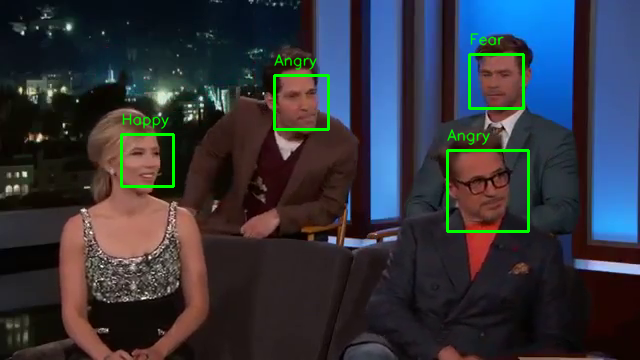

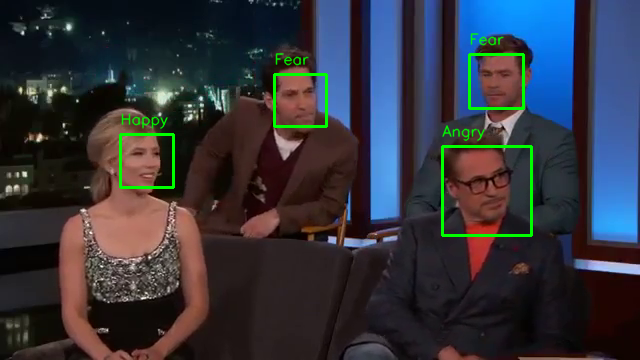

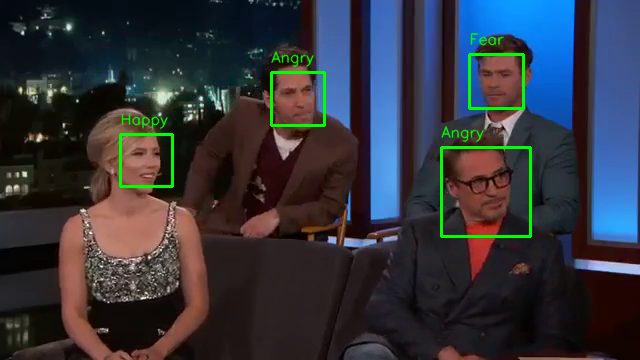

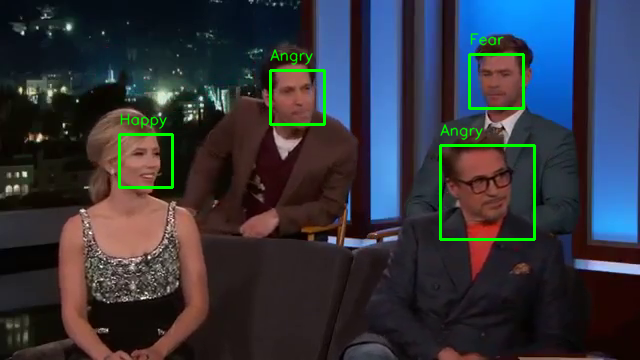

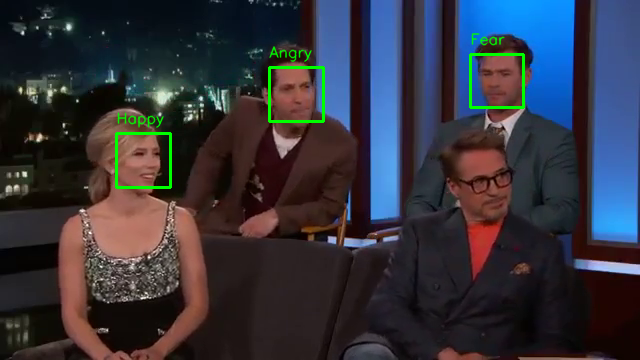

...

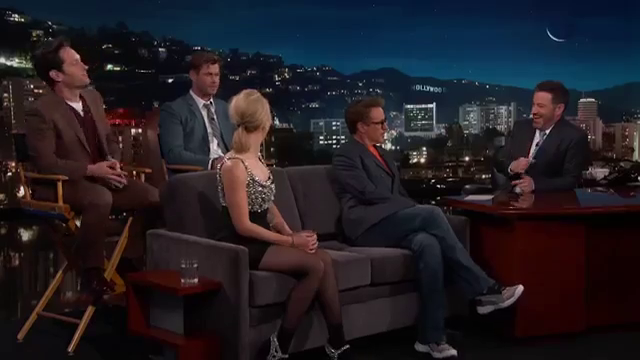

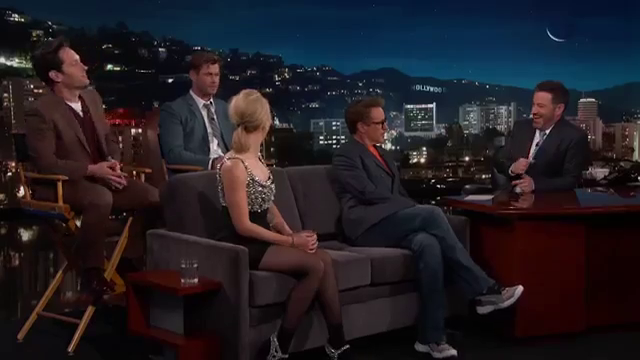

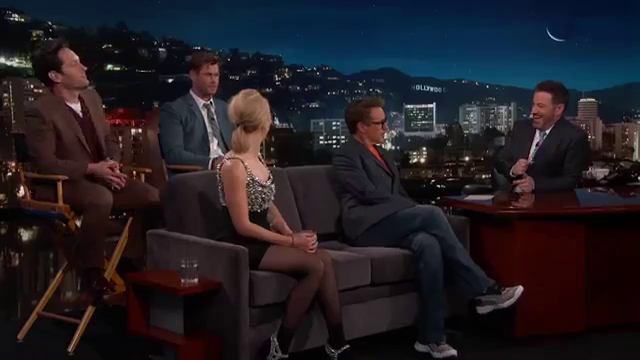

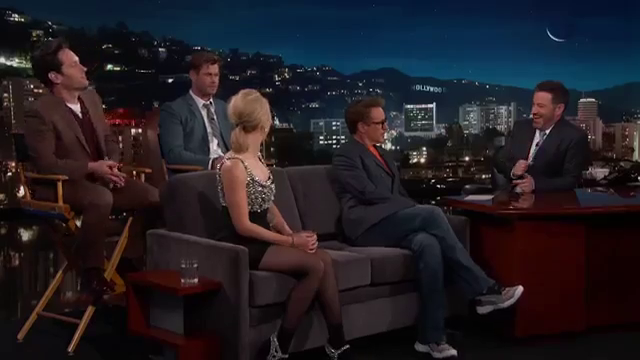

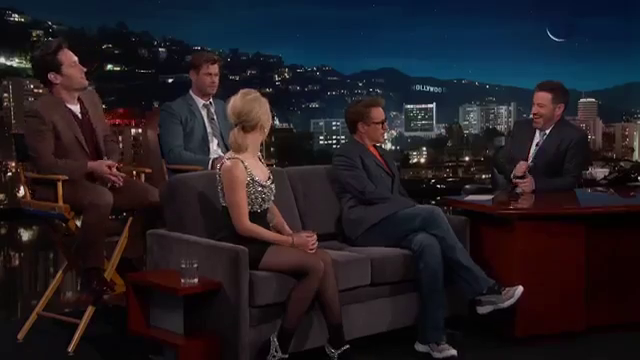

Finish


In [66]:
while(cv2.waitKey(1) < 0):
  conectado, frame = cap.read()

  if not conectado:
    break;

  deteccoes = detector_faces.detectMultiScale(frame, scaleFactor = 1.2, minNeighbors = 5, minSize = (30,30))

  if (len(deteccoes) > 0):
    for (x,y,w,h) in deteccoes:
      frame = cv2.rectangle(frame, (x, y), (x+w, y+h), (0,255,0), 2)

      roi = frame[y:y+h, x:x+w]
      roi = cv2.resize(roi, (48,48))
      roi = roi / 255
      roi = np.expand_dims(roi, axis=0)

      previsao = rede_salva.predict(roi)

      if previsao is not None:
        resultado = np.argmax(previsao)
        cv2.putText(frame, emocoes[resultado], (x, y -10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 1, cv2.LINE_AA)

  cv2_imshow(frame)
  output_video.write(frame)

print('Finish')
cv2.destroyAllWindows()
output_video.release()